<a href="https://colab.research.google.com/github/yeesem/Soft-Computing/blob/main/Lecture%204%20-%20Clustering_and_Dimensional_Reduction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
!pip3 install -U ucimlrepo

In [21]:
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns

from ucimlrepo import fetch_ucirepo

import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

In [4]:
# fetch dataset
communities_and_crime = fetch_ucirepo(id=183)

# data (as pandas dataframes)
X = communities_and_crime.data.features
y = communities_and_crime.data.targets

In [5]:
col_to_drop = []
for col in X.columns:
  if X[col].dtype == object and X[col].str.contains('\?').any():
     if (X[col] == '?').sum() > 1000:
       col_to_drop.append(col)
     else:
       X[col] = X[col].replace('?',np.nan).astype(float)
       X[col] = X[col].fillna(X[col].median())

col_to_drop.append('communityname')
X.drop(columns = col_to_drop,inplace = True)

<ipython-input-5-575f8c4bdd9f>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X[col] = X[col].replace('?',np.nan).astype(float)
<ipython-input-5-575f8c4bdd9f>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X[col] = X[col].fillna(X[col].median())
<ipython-input-5-575f8c4bdd9f>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-c

In [6]:
X.head()

,state,fold,population,householdsize,racepctblack,racePctWhite,racePctAsian,racePctHisp,agePct12t21,agePct12t29,...,NumStreet,PctForeignBorn,PctBornSameState,PctSameHouse85,PctSameCity85,PctSameState85,LandArea,PopDens,PctUsePubTrans,LemasPctOfficDrugUn
0,8,1,0.19,0.33,0.02,0.90,0.12,0.17,0.34,0.47,...,0.0,0.12,0.42,0.50,0.51,0.64,0.12,0.26,0.20,0.32
1,53,1,0.00,0.16,0.12,0.74,0.45,0.07,0.26,0.59,...,0.0,0.21,0.50,0.34,0.60,0.52,0.02,0.12,0.45,0.00
2,24,1,0.00,0.42,0.49,0.56,0.17,0.04,0.39,0.47,...,0.0,0.14,0.49,0.54,0.67,0.56,0.01,0.21,0.02,0.00
3,34,1,0.04,0.77,1.00,0.08,0.12,0.10,0.51,0.50,...,0.0,0.19,0.30,0.73,0.64,0.65,0.02,0.39,0.28,0.00
4,42,1,0.01,0.55,0.02,0.95,0.09,0.05,0.38,0.38,...,0.0,0.11,0.72,0.64,0.61,0.53,0.04,0.09,0.02,0.00


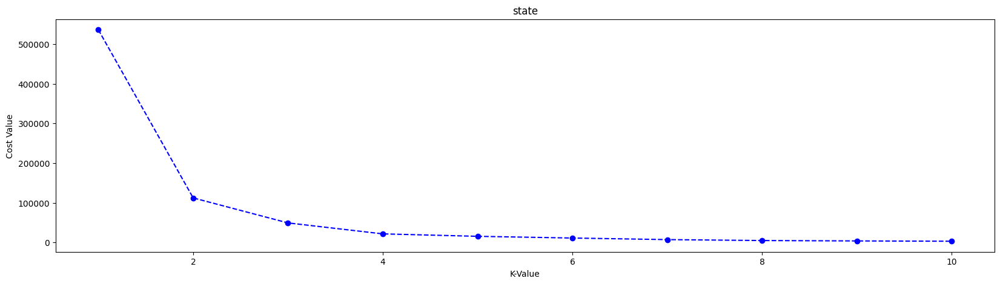

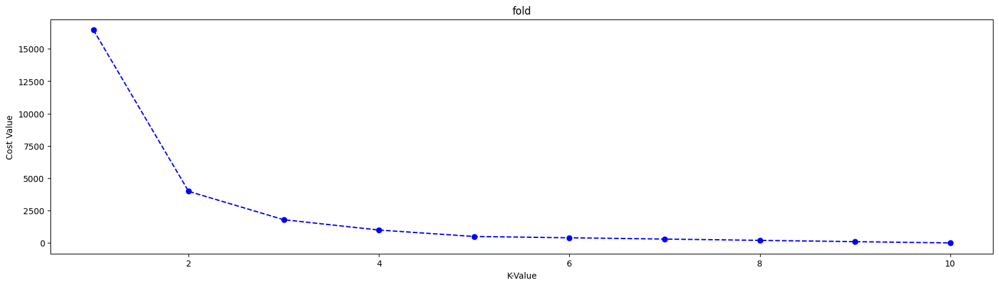

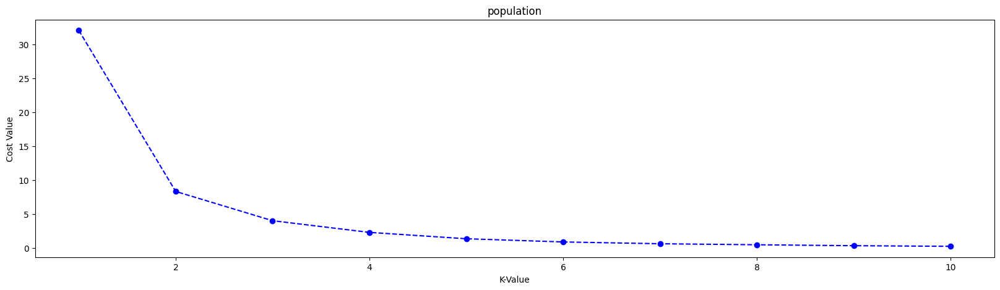

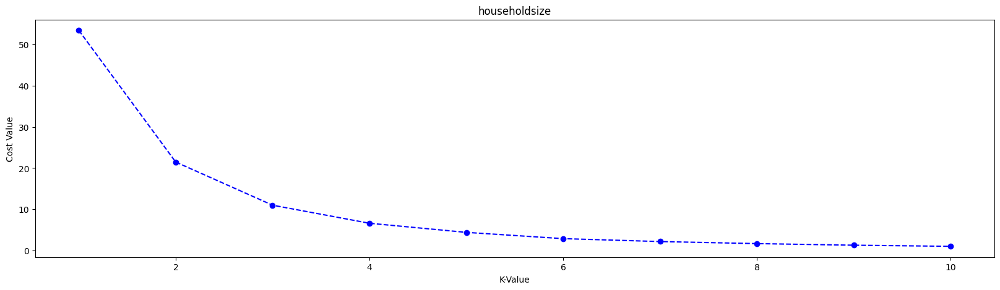

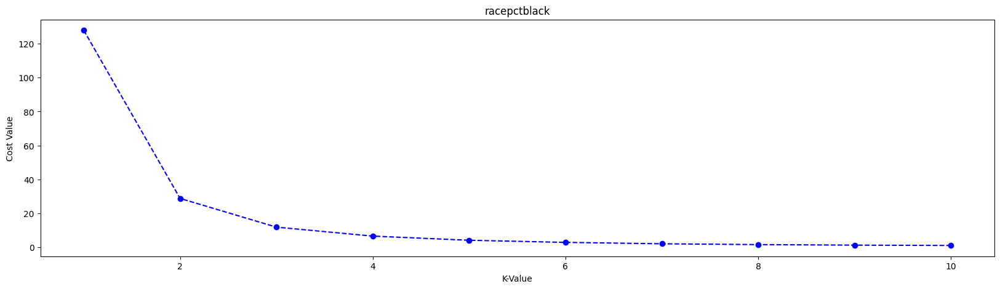

...

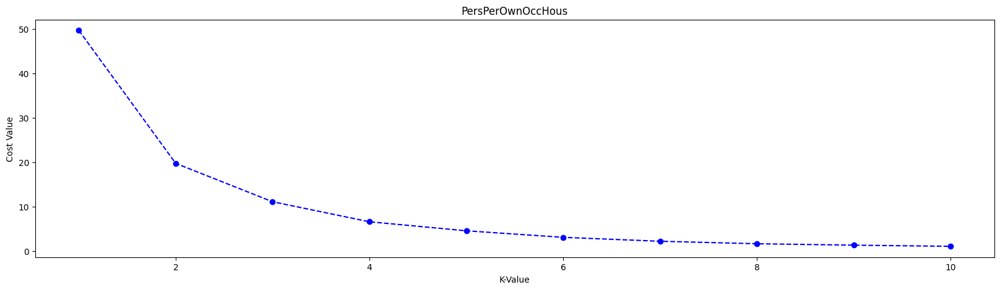

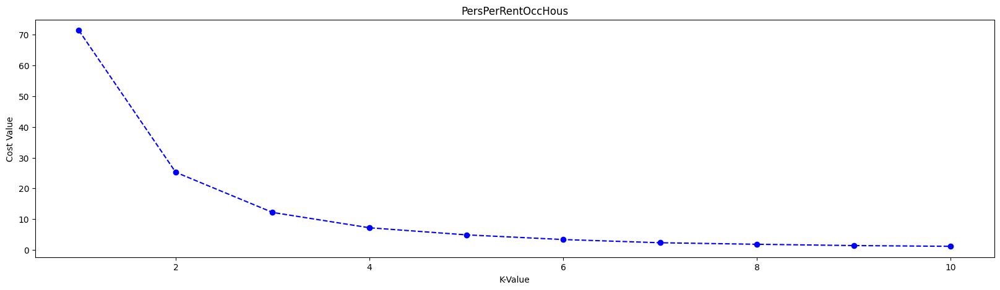

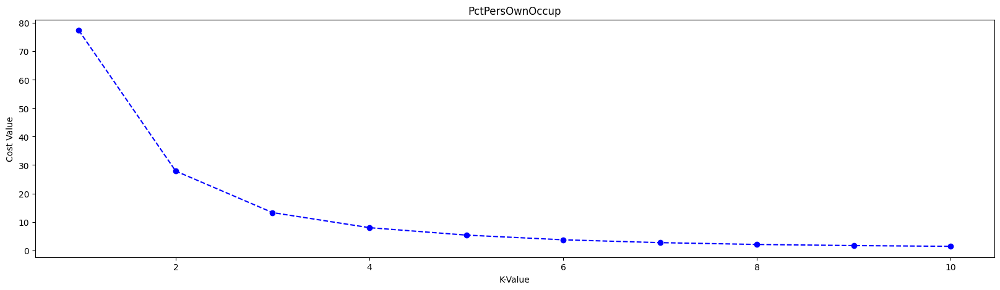

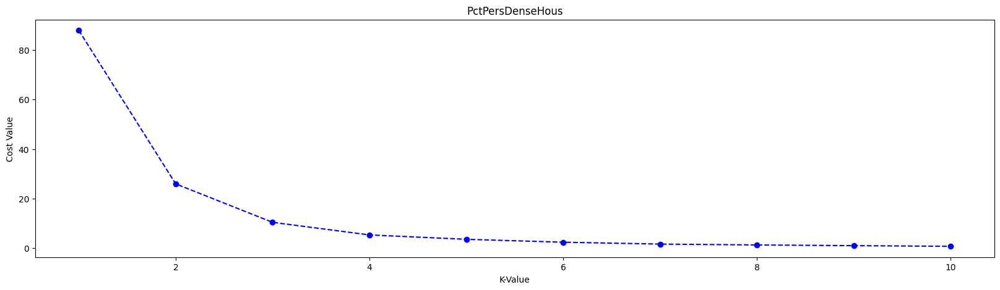

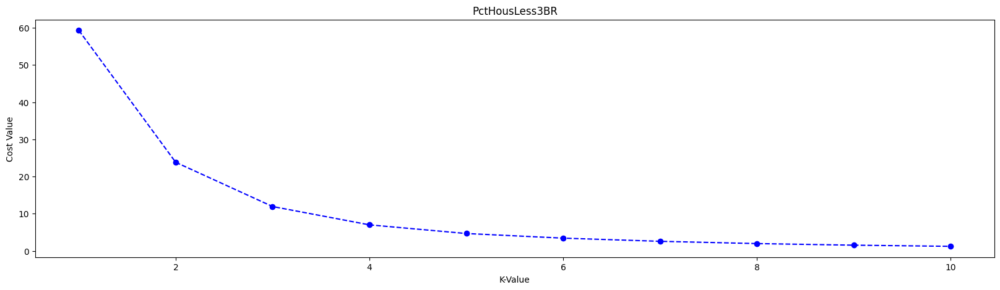

<ipython-input-11-2e3d6c0fee07>:8: ConvergenceWarning: Number of distinct clusters (3) found smaller than n_clusters (4). Possibly due to duplicate points in X.
  kmeans.fit(data)
<ipython-input-11-2e3d6c0fee07>:8: ConvergenceWarning: Number of distinct clusters (3) found smaller than n_clusters (5). Possibly due to duplicate points in X.
  kmeans.fit(data)
<ipython-input-11-2e3d6c0fee07>:8: ConvergenceWarning: Number of distinct clusters (3) found smaller than n_clusters (6). Possibly due to duplicate points in X.
  kmeans.fit(data)
<ipython-input-11-2e3d6c0fee07>:8: ConvergenceWarning: Number of distinct clusters (3) found smaller than n_clusters (7). Possibly due to duplicate points in X.
  kmeans.fit(data)
<ipython-input-11-2e3d6c0fee07>:8: ConvergenceWarning: Number of distinct clusters (3) found smaller than n_clusters (8). Possibly due to duplicate points in X.
  kmeans.fit(data)
<ipython-input-11-2e3d6c0fee07>:8: ConvergenceWarning: Number of distinct clusters (3) found smaller

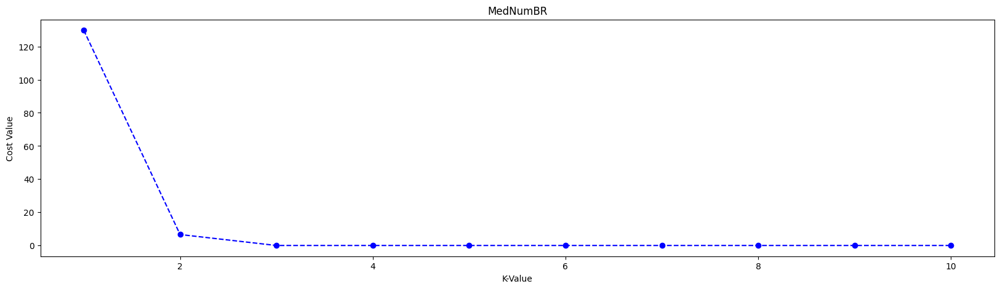

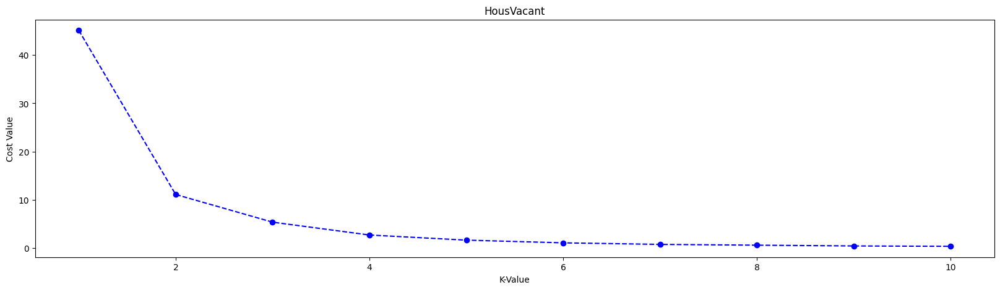

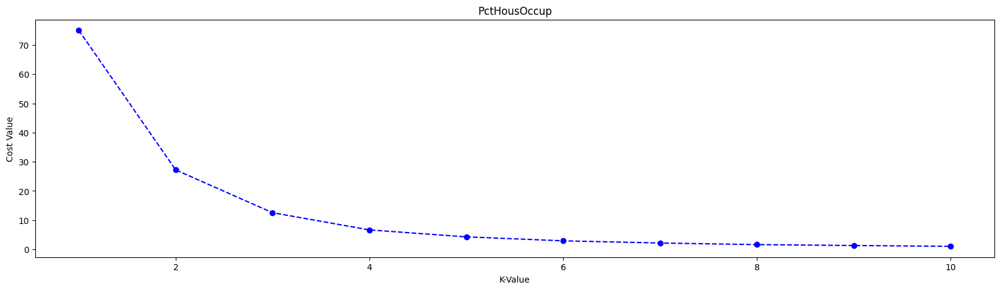

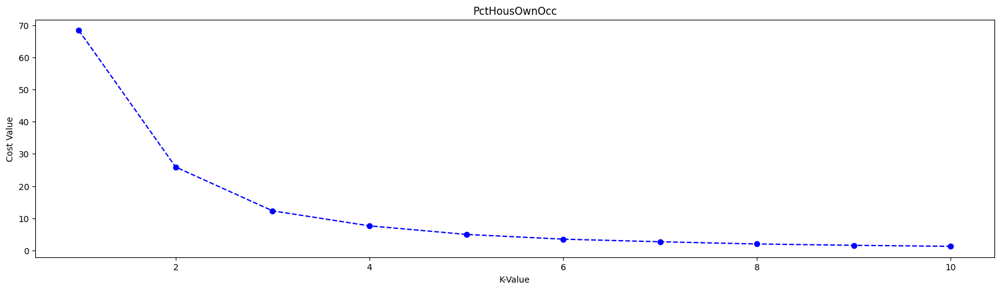

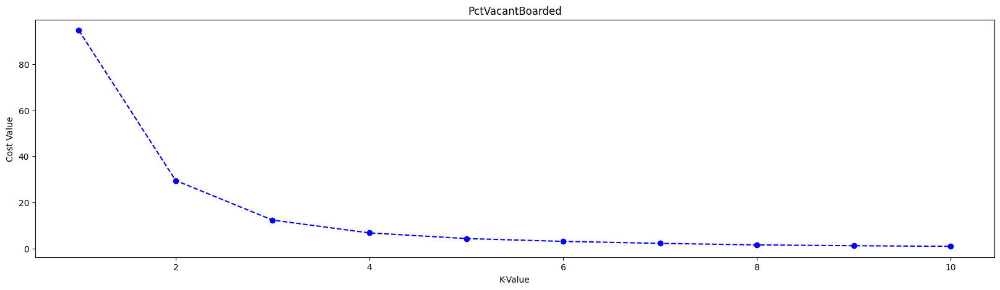

...

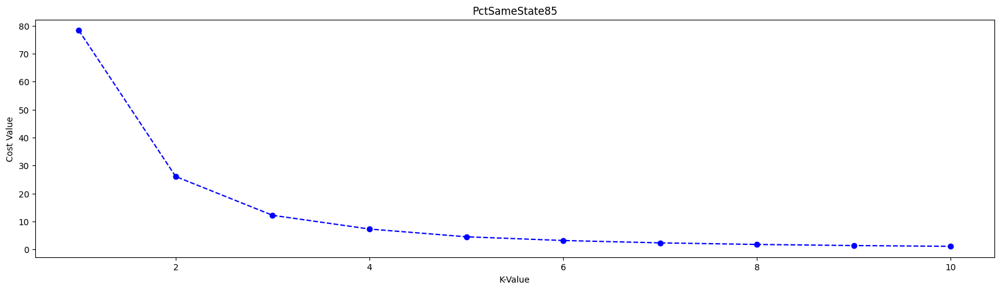

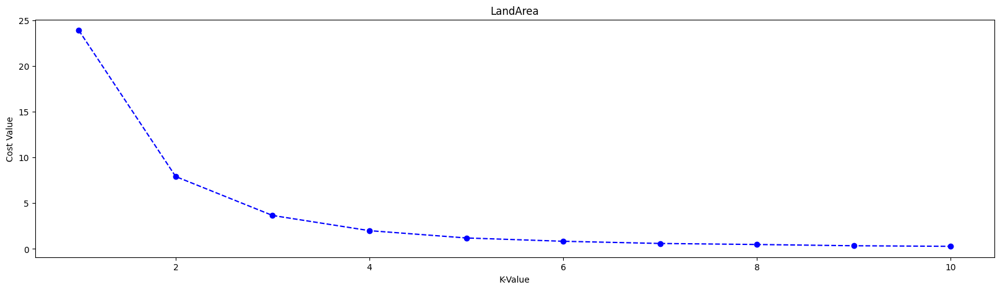

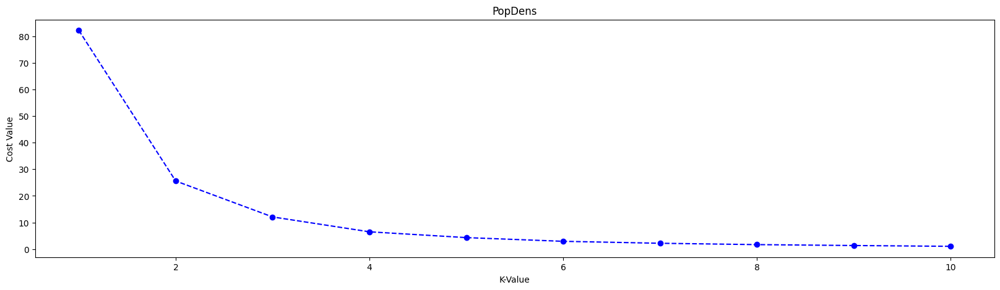

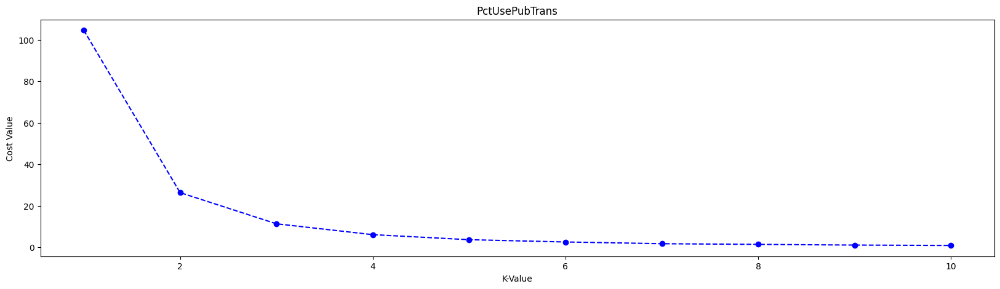

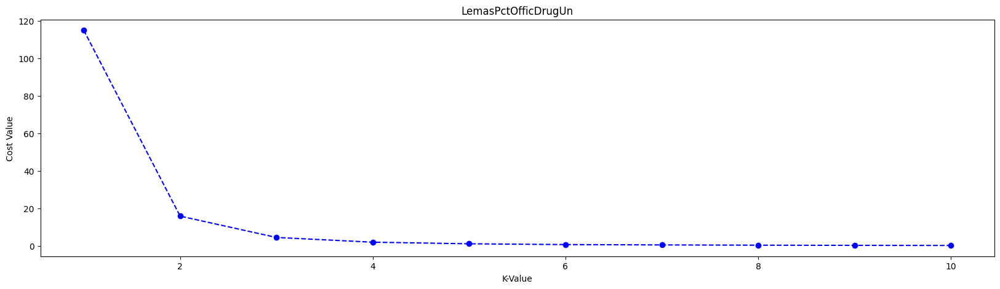

In [11]:
num_cluster = 10
kmean_obj = []
for col in X.columns:
  data = X[col].values.reshape(-1,1)
  cost_value = []
  for n_cluster in range(1,num_cluster+1):
    kmeans = KMeans(n_clusters = n_cluster)
    kmeans.fit(data)
    cost_value.append(kmeans.inertia_)
    if n_cluster == 3:
      kmean_obj.append(kmeans)

  plt.figure(figsize = (20,5))
  plt.plot(range(1,num_cluster+1),cost_value,color = 'b',linestyle = "--",marker = 'o')
  plt.xlabel("K-Value")
  plt.ylabel("Cost Value")
  plt.title(col)
  plt.show()


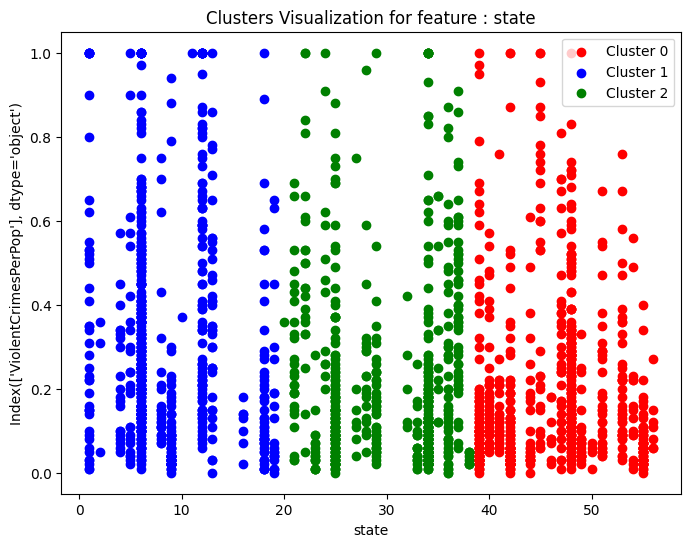

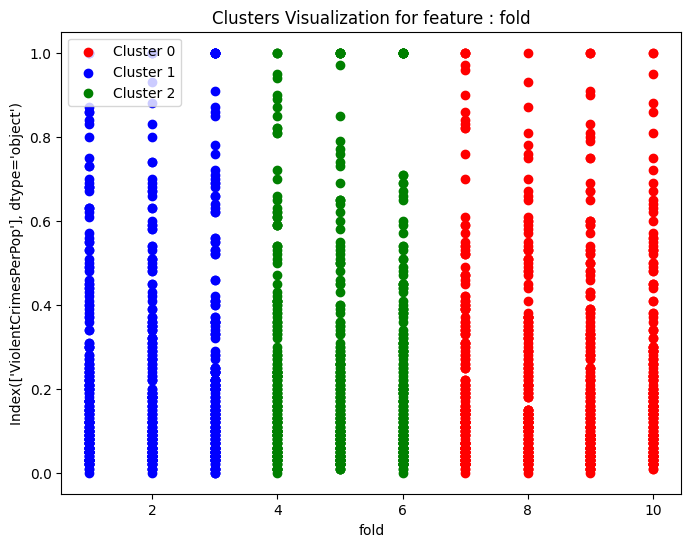

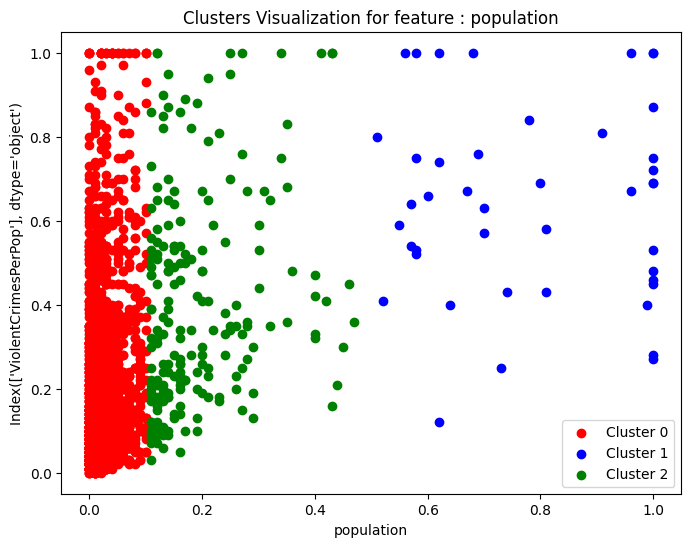

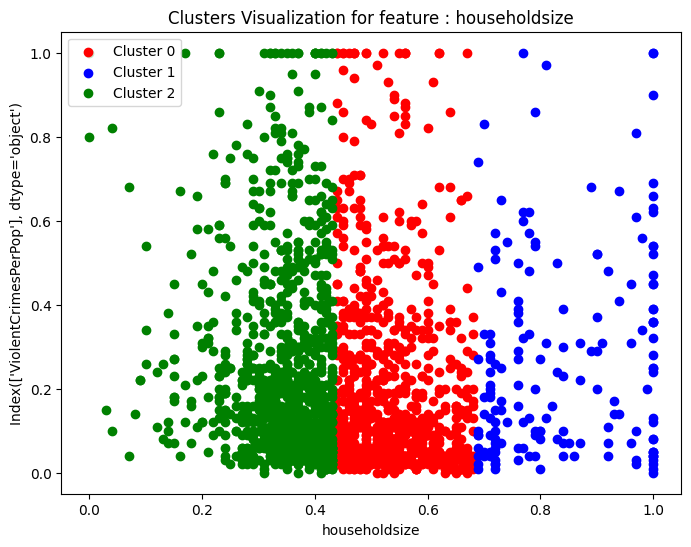

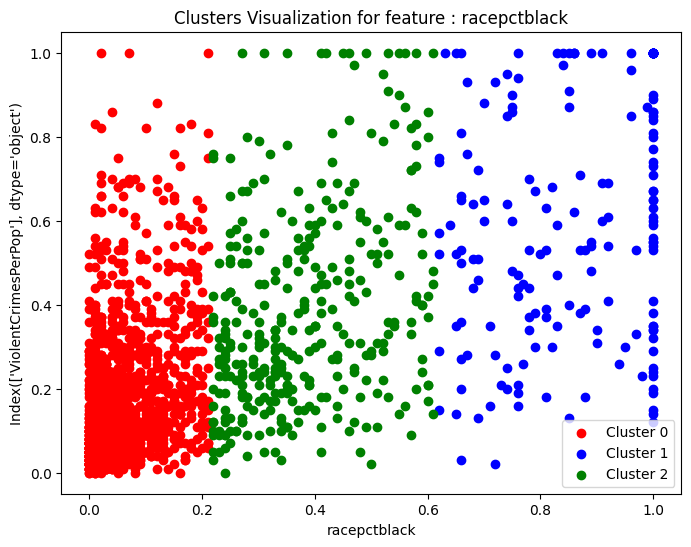

...

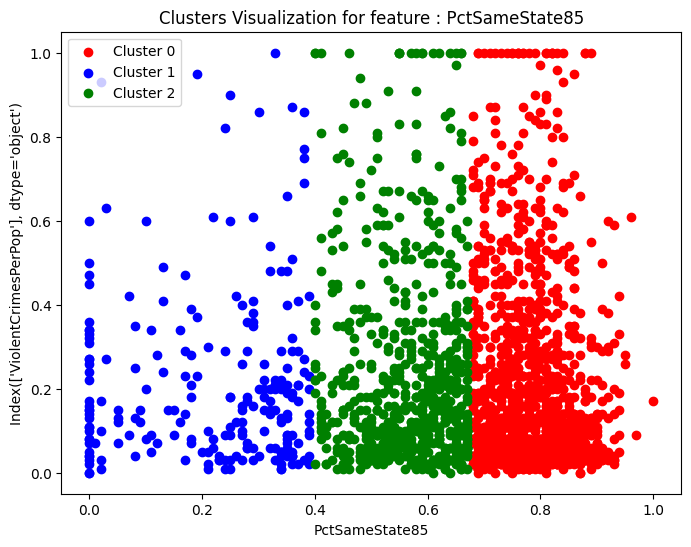

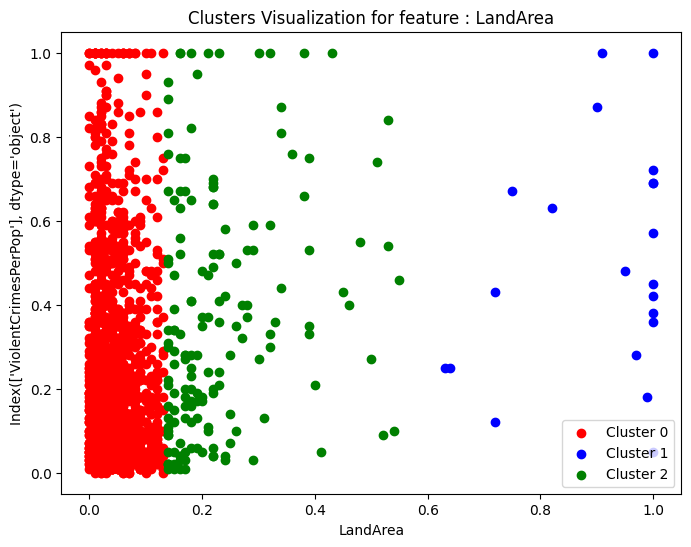

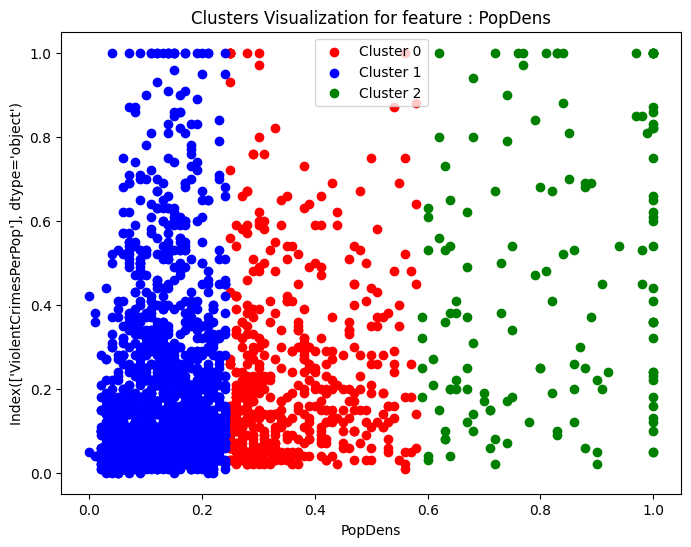

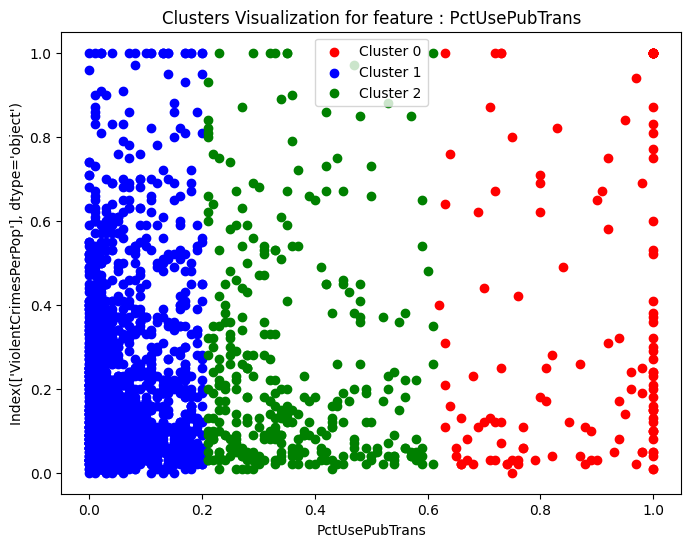

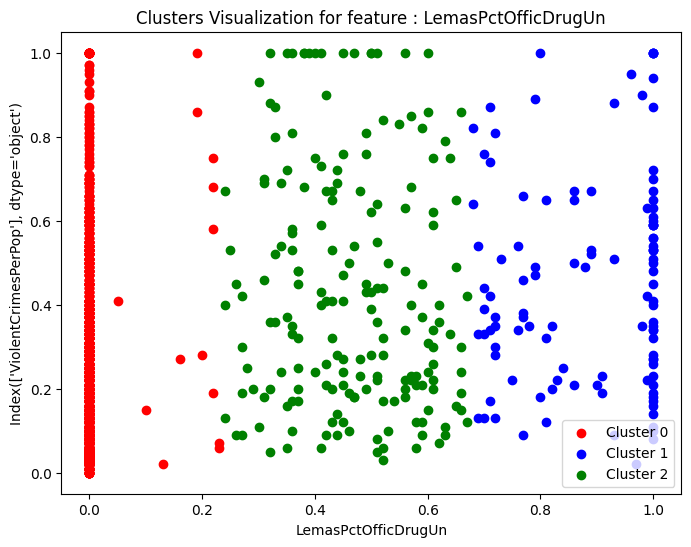

In [20]:
#Clusters visualization for features
col = X.columns
for i,obj in enumerate(kmean_obj):
  plt.figure(figsize = (8,6))
  label = obj.labels_
  plt.title(f"Clusters Visualization for feature : {col[i]}")
  plt.scatter(X.loc[label == 0,col[i]],y[label == 0],color = 'r',label = 'Cluster 0')
  plt.scatter(X.loc[label == 1,col[i]],y[label == 1],color = 'b',label = 'Cluster 1')
  plt.scatter(X.loc[label == 2,col[i]],y[label == 2],color = 'g',label = 'Cluster 2')
  plt.xlabel(col[i])
  plt.ylabel(y.columns)
  plt.legend()
  plt.show()

# **PCA**

In [65]:
pca = PCA(n_components = 2)
X_pca = pca.fit_transform(X)

explained_variance_ratio = pca.explained_variance_ratio_
print("Explained Variance Ratio:", explained_variance_ratio)

print("\n")

print("Maximum correlated with first principal components : ",max(pca.components_[0,:]),f"[{col[np.argmax(pca.components_[0,:])]}]")
print("Minimum correlated with first principal components : ",min(pca.components_[0,:]),f"[{col[np.argmin(pca.components_[0,:])]}]")

print("\nMaximum correlated with second principal components : ",max(pca.components_[1,:]),f"[{col[np.argmax(pca.components_[1,:])]}]")
print("Minimum correlated with second principal components : ",min(pca.components_[1,:]),f"[{col[np.argmin(pca.components_[1,:])]}]")

Explained Variance Ratio: [0.95684524 0.02938427]


Maximum correlated with first principal components :  0.00516520335997635 [OwnOccMedVal]
Minimum correlated with first principal components :  -0.9997575224154869 [state]

Maximum correlated with second principal components :  0.999792830744985 [fold]
Minimum correlated with second principal components :  -0.004367700244849741 [PctOccupManu]


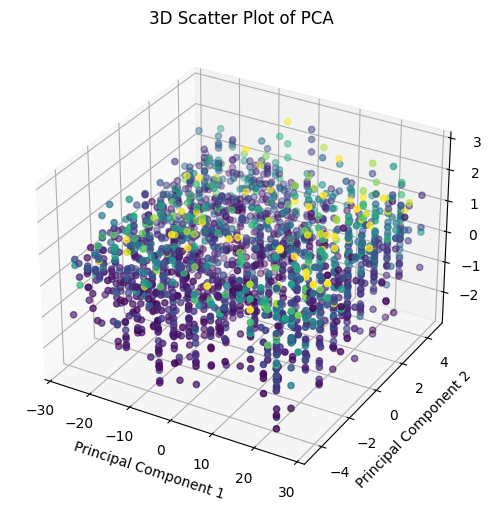

In [46]:
from mpl_toolkits.mplot3d import Axes3D

pca = PCA(n_components=3)

X_pca = pca.fit_transform(X)

fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection='3d')

ax.scatter(X_pca[:, 0], X_pca[:, 1], X_pca[:, 2], c=y, cmap='viridis')

ax.set_xlabel('Principal Component 1')
ax.set_ylabel('Principal Component 2')
ax.set_zlabel('Principal Component 3')
ax.set_title('3D Scatter Plot of PCA')

plt.show()


In [49]:
X_pca

array([[ 20.67455644,  -4.49899087],
       [-24.30535355,  -4.48410155],
       [  4.67190889,  -4.50409649],
       ...,
       [ 19.68249341,   4.48110693],
       [  3.6996685 ,   4.50807026],
       [ 22.71811884,   4.49157019]])